<a href="https://colab.research.google.com/github/Shivugoyal2210/AiBook/blob/main/HeadCount.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import wandb
import torch

In [2]:
import cv2
import os
directory = "/content/drive/MyDrive/HeadCountStuff/video-data"
filenames = os.listdir(directory)

In [3]:
filenames

['WhatsApp Video 2025-11-12 at 10.26.16 AM.mp4', 'JapanTrim1.mp4']

In [5]:
from google.colab.patches import cv2_imshow

In [ ]:
!pip install -r /content/drive/MyDrive/HeadCountStuff/requirements.txt

/content/drive/MyDrive/HeadCountStuff/video-data/JapanTrim1.mp4


/usr/local/lib/python3.12/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:123: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)
Frame 0: fac

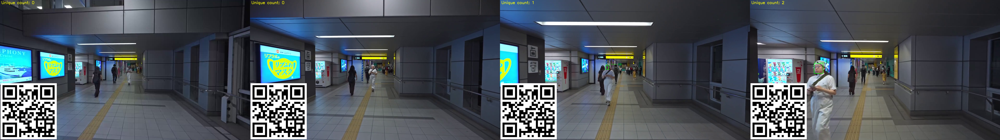

Frame 240: faces=0, unique=2
Frame 300: faces=1, unique=3
Frame 360: faces=0, unique=3
Frame 420: faces=2, unique=5


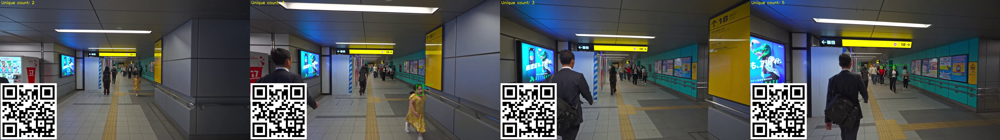

Frame 480: faces=5, unique=10
Frame 540: faces=4, unique=13
Frame 600: faces=4, unique=17


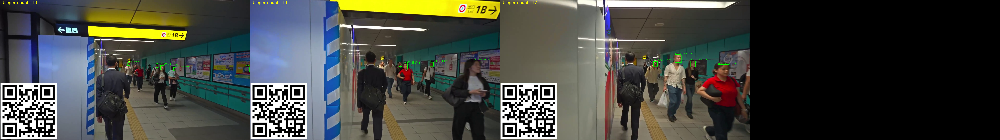

Final unique count: 17


In [29]:
import numpy as np

def is_frontal_enough(face, max_offset_ratio=0.90):
    """
    Returns True if the face is roughly frontal based on landmarks.
    max_offset_ratio: smaller = stricter.
    """
    kps = face.kps  # [left_eye, right_eye, nose, left_mouth, right_mouth]
    left_eye, right_eye, nose = kps[0], kps[1], kps[2]

    eye_dx = abs(left_eye[0] - right_eye[0]) + 1e-6
    nose_center = (left_eye[0] + right_eye[0]) / 2
    offset_ratio = abs(nose_center - nose[0]) / eye_dx
    return offset_ratio < max_offset_ratio

import cv2
import numpy as np
from numpy.linalg import norm
from insightface.app import FaceAnalysis
from google.colab.patches import cv2_imshow

# ---------- Face filtering & embedding ----------

def is_frontal_enough(face, max_offset_ratio=1):
    """
    Returns True if the face is roughly frontal based on landmarks.
    max_offset_ratio: smaller = stricter.
    """
    kps = face.kps  # [left_eye, right_eye, nose, left_mouth, right_mouth]
    left_eye, right_eye, nose = kps[0], kps[1], kps[2]

    eye_dx = abs(left_eye[0] - right_eye[0]) + 1e-6
    nose_center = (left_eye[0] + right_eye[0]) / 2
    offset_ratio = abs(nose_center - nose[0]) / eye_dx
    return offset_ratio < max_offset_ratio


def detect_faces_and_embeddings(frame_bgr, face_detector,
                                min_size=0, max_offset_ratio=0.80, min_conf = 0.5):
    """
    Returns a list of dicts:
      { 'box': (x, y, w, h), 'embedding': np.array, 'score': float }
    Filters out very small / non-frontal faces.
    """
    faces = face_detector.get(frame_bgr)
    results = []

    for face in faces:
        x1, y1, x2, y2 = face.bbox.astype(int)
        w, h = x2 - x1, y2 - y1

        # size filter
        if w < min_size or h < min_size or face.det_score < min_conf:
            continue

        # frontal-ish filter
        if not is_frontal_enough(face, max_offset_ratio=max_offset_ratio):
            continue

        emb = face.embedding  # 512-d (default for buffalo_l)
        results.append({
            "box": (x1, y1, w, h),
            "embedding": emb,
            "score": face.det_score
        })

    return results

# ---------- Gallery for de-duplication ----------

class FaceGallery:
    def __init__(self, sim_threshold=0.45):
        """
        sim_threshold: cosine similarity threshold for 'same person'.
        Higher = stricter.
        """
        self.embs = []       # list of (id, embedding)
        self.next_id = 0
        self.sim_threshold = sim_threshold

    def _cosine_sim(self, a, b):
        return float(np.dot(a, b) / (norm(a) * norm(b) + 1e-8))

    def add_or_get_id(self, emb):
        """
        Given an embedding, return an existing person_id or create a new one.
        """
        if not self.embs:
            pid = self.next_id
            self.next_id += 1
            self.embs.append((pid, emb))
            return pid, True  # new person

        sims = [self._cosine_sim(emb, e) for (_, e) in self.embs]
        best_idx = int(np.argmax(sims))
        best_pid, best_emb = self.embs[best_idx]
        best_sim = sims[best_idx]

        if best_sim >= self.sim_threshold:
            # same person; optionally update embedding centroid
            self.embs[best_idx] = (best_pid, 0.9 * best_emb + 0.1 * emb)
            return best_pid, False
        else:
            # new person
            pid = self.next_id
            self.next_id += 1
            self.embs.append((pid, emb))
            return pid, True

# ---------- Video processing at 1 FPS ----------

def load_retinaface_detector(use_cpu=False):
    """
    Load RetinaFace via insightface.
    use_cpu=True  -> ctx_id = -1
    use_cpu=False -> ctx_id = 0 (GPU)
    """
    ctx_id = -1 if use_cpu else 0
    app = FaceAnalysis(name="buffalo_l")
    app.prepare(ctx_id=ctx_id)
    return app


import numpy as np

def process_video(video_path, process_fps=1.0, use_cpu=False):
    """
    Read a video and:
      - process 1 frame per second (process_fps)
      - detect faces with RetinaFace
      - embed + de-duplicate with FaceGallery
      - show processed frames in a 4-wide grid
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    face_detector = load_retinaface_detector(use_cpu=use_cpu)
    gallery = FaceGallery(sim_threshold=0.40)
    unique_count = 0

    fps = cap.get(cv2.CAP_PROP_FPS)
    if fps <= 0:
        fps = 30.0  # fallback
    frame_interval = max(int(round(fps / process_fps)), 1)

    frame_idx = 0

    grid_buffer = []       # <--- NEW: store processed frames here
    grid_width = 4         # number of frames per row

    while True:
        ret, frame = cap.read()
        if not ret:
            break  # end of video

        # Only process 1 frame per second
        if frame_idx % frame_interval == 0:
            faces_info = detect_faces_and_embeddings(frame, face_detector)

            for f in faces_info:
                emb = f["embedding"]
                (pid, is_new) = gallery.add_or_get_id(emb)
                if is_new:
                    unique_count += 1

                (x, y, w, h) = f["box"]
                cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(frame, f"ID {pid} Score {f["score"]:.2f}", (x, y - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # overlay unique count
            cv2.putText(frame, f"Unique count: {unique_count}", (10, 30),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2)

            # --- NEW: add frame to grid buffer instead of showing directly ---
            grid_buffer.append(frame.copy())
            print(f"Frame {frame_idx}: faces={len(faces_info)}, unique={unique_count}")

            # When we have 4 frames, build a 1x4 grid and show it
            if len(grid_buffer) == grid_width:
                # ensure same size
                h, w = grid_buffer[0].shape[:2]
                resized = [cv2.resize(f, (w, h)) for f in grid_buffer]
                grid = np.hstack(resized)  # 1 row, 4 columns
                cv2_imshow(grid)
                grid_buffer = []

        frame_idx += 1

        # if cv2.waitKey(1) & 0xFF == ord('q'):
        #     break

    cap.release()
    # cv2.destroyAllWindows()

    # Show any leftover frames (less than 4) at the end
    if grid_buffer:
        h, w = grid_buffer[0].shape[:2]
        resized = [cv2.resize(f, (w, h)) for f in grid_buffer]
        # pad with black frames so we still have width 4
        while len(resized) < grid_width:
            resized.append(np.zeros_like(resized[0]))
        grid = np.hstack(resized)
        cv2_imshow(grid)

    print("Final unique count:", unique_count)



# --------- Usage ---------
video_path = f"/content/drive/MyDrive/HeadCountStuff/video-data/{filenames[1]}"
print(video_path)
process_video(video_path, process_fps=1.0, use_cpu=False)  # 1 frame per second


"""
Utilities to export detected faces (crops + embeddings) for visualization in FiftyOne.

Copy/paste this into a notebook cell (after the existing detection helpers are defined)
or import the module directly in the notebook:

    !pip install -q fiftyone
    from fiftyone_export import export_faces_for_fiftyone
    dataset, session = export_faces_for_fiftyone(
        video_path=f"/content/drive/MyDrive/HeadCountStuff/video-data/{filenames[1]}",
        process_fps=1.0,
        use_cpu=False,
    )

Prerequisites expected in the notebook session:
- `detect_faces_and_embeddings` and `load_retinaface_detector` already defined (from the provided code).
- OpenCV (`cv2`) installed and importable.
"""

import os
from typing import List, Optional, Tuple

import cv2
import fiftyone as fo
import numpy as np


def _ensure_frame_interval(cap: cv2.VideoCapture, process_fps: float) -> int:
    fps = cap.get(cv2.CAP_PROP_FPS)
    if fps <= 0:
        fps = 30.0  # fallback
    return max(int(round(fps / process_fps)), 1)


def export_faces_for_fiftyone(
    video_path: str,
    output_dir: str = "/content/drive/MyDrive/HeadCountStuff/face-crops",
    process_fps: float = 1.0,
    use_cpu: bool = False,
    min_size: int = 0,
    max_offset_ratio: float = 0.80,
    min_conf: float = 0.5,
    dataset_name: str = "headcount_faces",
    face_detector=None,
) -> Tuple[fo.Dataset, "fo.session.session"]:
    """
    Runs face detection at a reduced FPS, saves cropped faces to disk, and builds
    a FiftyOne dataset with embeddings for interactive visualization.

    Args:
        video_path: Path to the input video.
        output_dir: Directory where cropped face images will be written.
        process_fps: How many frames per second to process (sampling rate).
        use_cpu: Whether to run inference on CPU (passed to load_retinaface_detector).
        min_size: Minimum face size (pixels) to keep.
        max_offset_ratio: Frontal filter threshold from detect_faces_and_embeddings.
        min_conf: Minimum detection confidence to keep.
        dataset_name: Name of the FiftyOne dataset (overwrites if it exists).
        face_detector: Optional preloaded detector from load_retinaface_detector.

    Returns:
        (dataset, session) where dataset is the FiftyOne Dataset and session is
        the launched FiftyOne App session.
    """
    os.makedirs(output_dir, exist_ok=True)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise RuntimeError(f"Could not open video: {video_path}")

    if face_detector is None:
        face_detector = load_retinaface_detector(use_cpu=use_cpu)

    frame_interval = _ensure_frame_interval(cap, process_fps)

    samples: List[fo.Sample] = []
    frame_idx = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        if frame_idx % frame_interval != 0:
            frame_idx += 1
            continue

        faces = detect_faces_and_embeddings(
            frame,
            face_detector,
            min_size=min_size,
            max_offset_ratio=max_offset_ratio,
            min_conf=min_conf,
        )

        for j, face in enumerate(faces):
            x, y, w, h = face["box"]
            crop = frame[y : y + h, x : x + w]

            crop_path = os.path.join(output_dir, f"f{frame_idx:06d}_p{j}.jpg")
            cv2.imwrite(crop_path, crop)

            sample = fo.Sample(filepath=crop_path)
            sample["frame_index"] = frame_idx
            sample["detection_score"] = float(face["score"])
            # Store embedding as a vector field for FiftyOne visualizations
            sample["embedding"] = fo.Vector(np.asarray(face["embedding"], dtype=float).tolist())
            samples.append(sample)

        frame_idx += 1

    cap.release()

    dataset = fo.Dataset(dataset_name, overwrite=True)
    dataset.add_samples(samples)

    print(f"Saved {len(samples)} face crops to {output_dir}")
    print(f"Dataset '{dataset.name}' ready for visualization in FiftyOne.")
    session = fo.launch_app(dataset)
    return dataset, session


if __name__ == "__main__":
    # Minimal CLI usage example (adjust the path to your video):
    # python fiftyone_export.py "/path/to/video.mp4"
    import sys

    if len(sys.argv) < 2:
        print("Usage: python fiftyone_export.py <video_path>")
        sys.exit(1)

    export_faces_for_fiftyone(sys.argv[1])


In [ ]:
print("hello worlds")
